In [1]:
listy = []

#DO NOT RUN THIS CELL

In [82]:
import pandas as pd
from urllib.request import urlopen
from bs4 import BeautifulSoup
from urllib.request import Request, urlopen
import re
from datetime import datetime
import plotly.express as px
from IPython.display import display, HTML  
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from matplotlib import rc
import tensorflow
import sklearn
pd.set_option('mode.chained_assignment', None)  

#importing relevant libraries - these are added on an when needed basis and always in this cell

# Import and Scrape Covid-19 and Index Data

### Covid-19

In [3]:
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
confirmed = pd.read_csv(url, error_bad_lines=False)

#importing confirmed cases data - SOURCE: John Hopkins University

In [4]:
url1 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
deaths = pd.read_csv(url1, error_bad_lines=False)

#importing deaths data - SOURCE: John Hopkins University

In [5]:
url2 = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
recovered = pd.read_csv(url2, error_bad_lines=False)

#importing confirmed recoveries data - SOURCE: John Hopkins University

### Index Data

In [6]:
req = Request('https://uk.investing.com/indices/major-indices', headers={'User-Agent': 'Mozilla/5.0'})
indices = urlopen(req).read()

#scraping live index data - SOURCE: https://uk.investing.com

In [7]:
soup = BeautifulSoup(indices, 'lxml')
type(soup)

#parse HTML file

bs4.BeautifulSoup

In [8]:
rows = soup.find_all('tr')

#parse HTML file

In [9]:
for row in rows:
    row_td = row.find_all('td')
    
#parse HTML file

In [10]:
str_cells = str(row_td)

#parse HTML file

In [11]:
cleantext = BeautifulSoup(str_cells, "lxml").get_text()

#parse HTML file

In [12]:
list_rows = []
for row in rows:
    cells = row.find_all('td')
    str_cells = str(cells)
    clean = re.compile('<.*?>')
    clean2 = (re.sub(clean, '',str_cells))
    list_rows.append(clean2)
    
#parse HTML file

In [13]:
col_labels = soup.find_all('th')
df = pd.DataFrame(list_rows)

#parse HTML file


df.head(10)

#extracted table displayed below

,0
0,[]
1,"[ , Dow 30, 21,388.29, 21,408.36, 21,022.02, -..."
2,"[ , S&amp;P 500, 2,510.75, 2,514.13, 2,484.13,..."
3,"[ , Nasdaq, 7,533.89, 7,541.14, 7,458.47, -166..."
4,"[ , SmallCap 2000, 1,102.90, 1,107.60, 1,085.1..."
5,"[ , S&amp;P 500 VIX, 53.76, 60.59, 53.46, +0.2..."
6,"[ , S&amp;P/TSX, 13,064.18, 13,138.51, 12,896...."
7,"[ , Bovespa, 70,644.57, 73,010.78, 69,635.15, ..."
8,"[ , S&amp;P/BMV IPC, 33,758.48, 34,118.00, 33,..."
9,"[ , DAX, 9,596.25, 9,685.00, 9,504.00, -339.59..."


In [14]:
df1 = df[0].str.split(', ', expand=True)
df1.head(10)

#splitting string into separate columns

,0,1,2,3,4,5,6,7,8
0,[],None,None,None,None,None,None,None,None
1,[,Dow 30,"21,388.29","21,408.36","21,022.02",-528.87,-2.41%,16:00:35,]
2,[,S&amp;P 500,"2,510.75","2,514.13","2,484.13",-73.84,-2.86%,16:00:37,]
3,[,Nasdaq,"7,533.89","7,541.14","7,458.47",-166.21,-2.16%,16:00:00,]
4,[,SmallCap 2000,"1,102.90","1,107.60","1,085.15",-35.11,-3.08%,16:00:39,]
5,[,S&amp;P 500 VIX,53.76,60.59,53.46,+0.22,+0.41%,16:00:29,]
6,[,S&amp;P/TSX,"13,064.18","13,138.51","12,896.62",-314.57,-2.35%,16:00:29,]
7,[,Bovespa,"70,644.57","73,010.78","69,635.15",-2375.19,-3.25%,15:45:00,]
8,[,S&amp;P/BMV IPC,"33,758.48","34,118.00","33,452.14",-796.05,-2.30%,15:40:00,]
9,[,DAX,"9,596.25","9,685.00","9,504.00",-339.59,-3.42%,16:00:41,]


In [15]:
df1 = df1[[1,2,3,4,5,6,7]]

In [16]:
col_labels = soup.find_all('th')
all_header = []     
col_str = str(col_labels)
cleantext2 = BeautifulSoup(col_str, "lxml").get_text()
all_header.append(cleantext2)
df2 = pd.DataFrame(all_header)
df3 = df2[0].str.split(',', expand=True)
df3 = df3[[1,2,3,4,5,6,7]]

#parse and extract column headers from original table to add to data columns as column headers

In [17]:
frames = [df3, df1]
df4 = pd.concat(frames)

In [18]:
new_header = df4.iloc[0] 
df4 = df4[2:] 
df4.columns = new_header

In [19]:
df4.columns = df4.columns.str.replace(' ', '')

In [20]:
df4['Index'] = df4['Index'].str.replace('&amp;', '&') 

#clean up index name strings

In [21]:
df4 = df4[0:42] 

#select only indices I am interested in

In [22]:
df4.index.name = datetime.today().strftime('%Y-%m-%d')
df4 = df4.rename(columns={"Time": datetime.today().strftime('%Y-%m-%d')})

In [23]:
df4.set_index('Index', inplace=True)
df4.head(10)

#display formatted dataframe as is on the website with date of snapshot indicated in final column

,Last,High,Low,Chg.,Chg.%,2020-04-01
Index,,,,,,
Dow 30,"21,388.29","21,408.36","21,022.02",-528.87,-2.41%,16:00:35
S&P 500,"2,510.75","2,514.13","2,484.13",-73.84,-2.86%,16:00:37
Nasdaq,"7,533.89","7,541.14","7,458.47",-166.21,-2.16%,16:00:00
SmallCap 2000,"1,102.90","1,107.60","1,085.15",-35.11,-3.08%,16:00:39
S&P 500 VIX,53.76,60.59,53.46,+0.22,+0.41%,16:00:29
S&P/TSX,"13,064.18","13,138.51","12,896.62",-314.57,-2.35%,16:00:29
Bovespa,"70,644.57","73,010.78","69,635.15",-2375.19,-3.25%,15:45:00
S&P/BMV IPC,"33,758.48","34,118.00","33,452.14",-796.05,-2.30%,15:40:00
DAX,"9,596.25","9,685.00","9,504.00",-339.59,-3.42%,16:00:41


In [24]:
listy.append(df4)

#important step that appends new data snapshot to a list of snapshots - creating a backlog of index data

In [25]:
CSS = """
.output {
    flex-direction: column;
}
"""

HTML('<style>{}</style>'.format(CSS))

#this is to be able to display mutliple dataframes in one output as in cell below

In [26]:
x = 0
for i in listy:
    display(i)
    x = x + 1

#each dataframe represents a daily snapshot of index data for all the major world indices

,Last,High,Low,Chg.,Chg.%,2020-04-01
Index,,,,,,
Dow 30,"21,388.29","21,408.36","21,022.02",-528.87,-2.41%,16:00:35
S&P 500,"2,510.75","2,514.13","2,484.13",-73.84,-2.86%,16:00:37
Nasdaq,"7,533.89","7,541.14","7,458.47",-166.21,-2.16%,16:00:00
SmallCap 2000,"1,102.90","1,107.60","1,085.15",-35.11,-3.08%,16:00:39
S&P 500 VIX,53.76,60.59,53.46,+0.22,+0.41%,16:00:29
S&P/TSX,"13,064.18","13,138.51","12,896.62",-314.57,-2.35%,16:00:29
Bovespa,"70,644.57","73,010.78","69,635.15",-2375.19,-3.25%,15:45:00
S&P/BMV IPC,"33,758.48","34,118.00","33,452.14",-796.05,-2.30%,15:40:00
DAX,"9,596.25","9,685.00","9,504.00",-339.59,-3.42%,16:00:41


# Time Series Visualisation of Covid-19 Data

In [27]:
just_data_confirmed = confirmed.drop(['Lat'], axis = 1) 
just_data_confirmed = just_data_confirmed.drop(['Long'], axis = 1)

just_data_deaths = deaths.drop(['Lat'], axis = 1) 
just_data_deaths = just_data_deaths.drop(['Long'], axis = 1)

just_data_recovered = recovered.drop(['Lat'], axis = 1) 
just_data_recovered = just_data_recovered.drop(['Long'], axis = 1)


In [28]:
sum_deaths_country = just_data_deaths.groupby(['Country/Region']).sum()
sum_deaths_country = sum_deaths_country.sort_values(by='3/28/20', ascending=False)

sum_confirmed_country = just_data_confirmed.groupby(['Country/Region']).sum()
sum_confirmed_country = sum_confirmed_country.sort_values(by='3/28/20', ascending=False)

sum_recovered_country = just_data_recovered.groupby(['Country/Region']).sum()
sum_recovered_country = sum_recovered_country.sort_values(by='3/28/20', ascending=False)

print('Deaths')
display(sum_deaths_country.head(5))

#deaths per country over time

print('Confirmed Cases')
display(sum_confirmed_country.head(5))

#confirmed cases per country over time

print("Recoveries")
display(sum_recovered_country.head(5))

#recoveries from covid-19 per country over time

Deaths


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Italy,0,0,0,0,0,0,0,0,0,0,...,5476,6077,6820,7503,8215,9134,10023,10779,11591,12428
Spain,0,0,0,0,0,0,0,0,0,0,...,1772,2311,2808,3647,4365,5138,5982,6803,7716,8464
China,17,18,26,42,56,82,131,133,171,213,...,3274,3274,3281,3285,3291,3296,3299,3304,3308,3309
Iran,0,0,0,0,0,0,0,0,0,0,...,1685,1812,1934,2077,2234,2378,2517,2640,2757,2898
France,0,0,0,0,0,0,0,0,0,0,...,676,862,1102,1333,1698,1997,2317,2611,3030,3532


Confirmed Cases


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,33276,43847,53740,65778,83836,101657,121478,140886,161807,188172
Italy,0,0,0,0,0,0,0,0,0,2,...,59138,63927,69176,74386,80589,86498,92472,97689,101739,105792
China,548,643,920,1406,2075,2877,5509,6087,8141,9802,...,81435,81498,81591,81661,81782,81897,81999,82122,82198,82279
Spain,0,0,0,0,0,0,0,0,0,0,...,28768,35136,39885,49515,57786,65719,73235,80110,87956,95923
Germany,0,0,0,0,0,1,4,4,4,5,...,24873,29056,32986,37323,43938,50871,57695,62095,66885,71808


Recoveries


,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
China,28,30,36,39,49,58,101,120,135,214,...,72362,72814,73280,73773,74181,74720,75100,75582,75923,76206
Italy,0,0,0,0,0,0,0,0,0,0,...,7024,7024,8326,9362,10361,10950,12384,13030,14620,15729
Spain,0,0,0,0,0,0,0,0,0,0,...,2575,2575,3794,5367,7015,9357,12285,14709,16780,19259
Iran,0,0,0,0,0,0,0,0,0,0,...,7931,7931,8913,9625,10457,11133,11679,12391,13911,14656
Germany,0,0,0,0,0,0,0,0,0,0,...,266,266,3243,3547,5673,6658,8481,9211,13500,16100


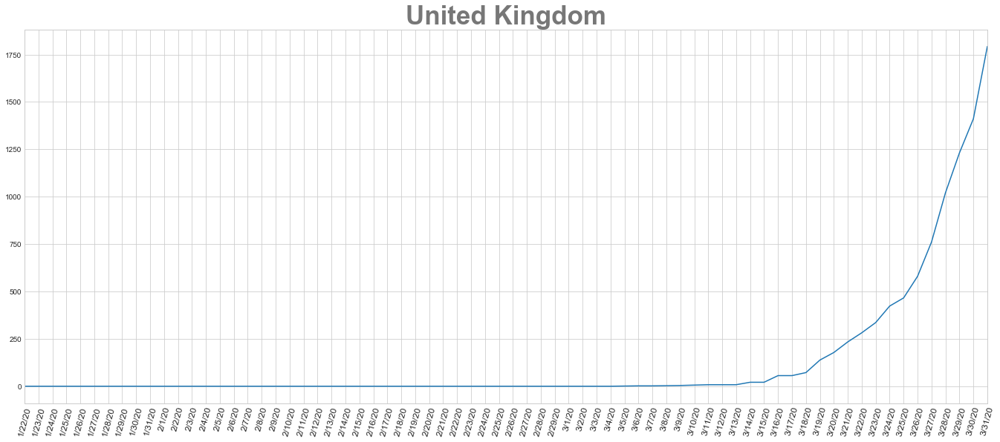

In [29]:
plt.style.use('seaborn-whitegrid')
fig= plt.figure(figsize=(18,7))

axes= fig.add_axes([0,0,1,1])

axes.plot(sum_deaths_country.loc['United Kingdom'])
plt.title('United Kingdom', color='#777777', size=35, weight=800)
plt.margins(x=0)
plt.xticks(rotation=75, size=12)

plt.show()

# Map Visualisations

Visualisations to understand the geopgraphical spread of the virus and the most impacted countries and regions with regards to confirmed cases, deaths and recoveries. 

In [30]:
fig = px.scatter_geo(deaths, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=deaths.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world')
fig.show()

fig1 = px.scatter_geo(confirmed, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=confirmed.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world')
fig1.show()

fig2 = px.scatter_geo(recovered, lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size=recovered.iloc[:,-1],
                     projection="natural earth", opacity=0.6, size_max=70, scope='world')
fig2.show()

### Preparing and Formating Dataframes to allow for animation

In [31]:
confirmed_top_20 = sum_confirmed_country.sort_values(by='3/28/20', ascending=False).head(20)
confirmed_top_20.head(5)

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,33276,43847,53740,65778,83836,101657,121478,140886,161807,188172
Italy,0,0,0,0,0,0,0,0,0,2,...,59138,63927,69176,74386,80589,86498,92472,97689,101739,105792
China,548,643,920,1406,2075,2877,5509,6087,8141,9802,...,81435,81498,81591,81661,81782,81897,81999,82122,82198,82279
Spain,0,0,0,0,0,0,0,0,0,0,...,28768,35136,39885,49515,57786,65719,73235,80110,87956,95923
Germany,0,0,0,0,0,1,4,4,4,5,...,24873,29056,32986,37323,43938,50871,57695,62095,66885,71808


In [32]:
numbers_confirmed = list(range(len(confirmed_top_20.columns)))

In [33]:
confirmed_top_20.columns = numbers_confirmed

In [34]:
deaths_top_20 = sum_deaths_country.sort_values(by='3/28/20', ascending=False).head(20)
deaths_top_20.head(5)

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Italy,0,0,0,0,0,0,0,0,0,0,...,5476,6077,6820,7503,8215,9134,10023,10779,11591,12428
Spain,0,0,0,0,0,0,0,0,0,0,...,1772,2311,2808,3647,4365,5138,5982,6803,7716,8464
China,17,18,26,42,56,82,131,133,171,213,...,3274,3274,3281,3285,3291,3296,3299,3304,3308,3309
Iran,0,0,0,0,0,0,0,0,0,0,...,1685,1812,1934,2077,2234,2378,2517,2640,2757,2898
France,0,0,0,0,0,0,0,0,0,0,...,676,862,1102,1333,1698,1997,2317,2611,3030,3532


In [35]:
numbers_deaths = list(range(len(deaths_top_20.columns)))

In [36]:
deaths_top_20.columns = numbers_deaths

# Animating Bar Charts 

The Bar Chart 'races' below visualise confirmed Cases and Deaths in most afflicted countries over time
- working on removing the static bar chart below the animation

In [37]:
def draw_chart(xyz):
        confirmed_top_20_order = confirmed_top_20.sort_values(by=(xyz),ascending=False)
        ax.clear()
        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
        ax.xaxis.set_ticks_position('top')
        ax.tick_params(axis='x', colors='#777777', labelsize=12)
        ax.set_yticklabels(confirmed_top_20_order.index)
        ax.barh(confirmed_top_20_order.index, confirmed_top_20_order[xyz], color='#eafb50')
        ax.text(0, 1.06, 'Confrimed Covid-19 Cases', transform=ax.transAxes, size=15, color='#000000', weight=800)
        ax.set_title(sum_confirmed_country.columns[xyz], color='#777777', size=35, weight=800)

In [38]:
plt.rcParams["animation.html"] = "jshtml"

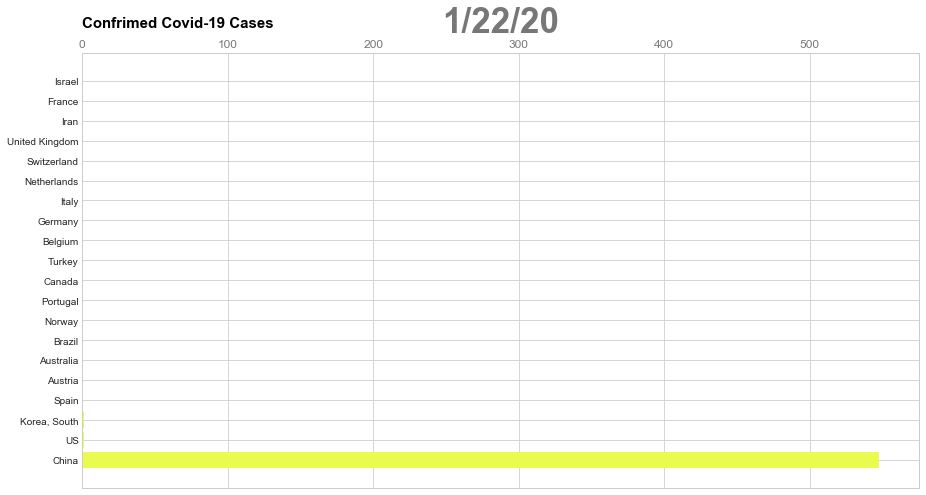

In [39]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_chart, frames=range(len(confirmed_top_20.columns)))
HTML(animator.to_jshtml())

In [40]:
def draw_chart_deaths(xyz):
        deaths_top_20_order =deaths_top_20.sort_values(by=(xyz),ascending=False)
        ax.clear()
        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
        ax.xaxis.set_ticks_position('top')
        ax.tick_params(axis='x', colors='#777777', labelsize=12)
        ax.set_yticklabels(deaths_top_20.index)
        ax.barh(deaths_top_20_order.index, deaths_top_20_order[xyz], color='#8B0000')
        ax.text(0, 1.06, 'Covid-19 Deaths', transform=ax.transAxes, size=15, color='#000000', weight=800)
        ax.set_title(sum_deaths_country.columns[xyz], color='#777777', size=35, weight=800)

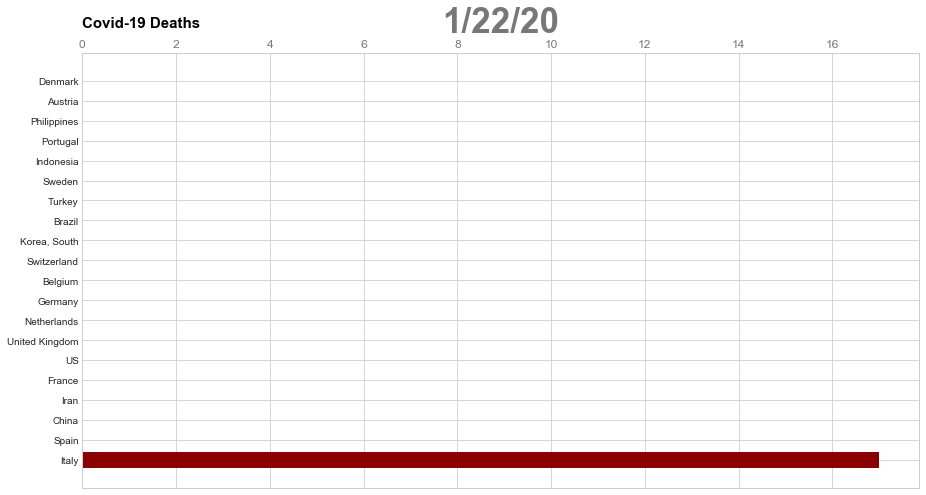

In [41]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_chart_deaths, frames=range(len(deaths_top_20.columns)))
HTML(animator.to_jshtml())

# Index Data

Everytime the notebook is run, the latest FTSE 100 data will be automatically appended to this table - consistent with the format seen below.

In [42]:
timeseries = pd.concat(listy, axis=1)

In [43]:
timeseries.head(10) 

,Last,High,Low,Chg.,Chg.%,2020-04-01
Index,,,,,,
Dow 30,"21,388.29","21,408.36","21,022.02",-528.87,-2.41%,16:00:35
S&P 500,"2,510.75","2,514.13","2,484.13",-73.84,-2.86%,16:00:37
Nasdaq,"7,533.89","7,541.14","7,458.47",-166.21,-2.16%,16:00:00
SmallCap 2000,"1,102.90","1,107.60","1,085.15",-35.11,-3.08%,16:00:39
S&P 500 VIX,53.76,60.59,53.46,+0.22,+0.41%,16:00:29
S&P/TSX,"13,064.18","13,138.51","12,896.62",-314.57,-2.35%,16:00:29
Bovespa,"70,644.57","73,010.78","69,635.15",-2375.19,-3.25%,15:45:00
S&P/BMV IPC,"33,758.48","34,118.00","33,452.14",-796.05,-2.30%,15:40:00
DAX,"9,596.25","9,685.00","9,504.00",-339.59,-3.42%,16:00:41


# FTSE 100 Historic Data

Visualisaing FTSE 100 data since the outbreak of the corona virus - specifically since confirmed cases in China surpassed 500.

NOTE: Ths data was downloaded from the internet and saved locally - I have step up a scraper at the end of the notebook which will feed live data into the notebook.

In [44]:
ftse_historic = pd.read_excel(r'Desktop/Market_Insider_FTSE_Historic.xlsx')

In [45]:
ftse_historic_closing = ftse_historic[['DATE','CLOSING PRICE']]

In [46]:
ftse = ftse_historic_closing[14:]

In [47]:
ftse = ftse.drop(["DATE"], axis = 1)

In [48]:
dates = pd.bdate_range(start="2020-01-22",end="2020-03-27")

In [49]:
ftse.index = dates

/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



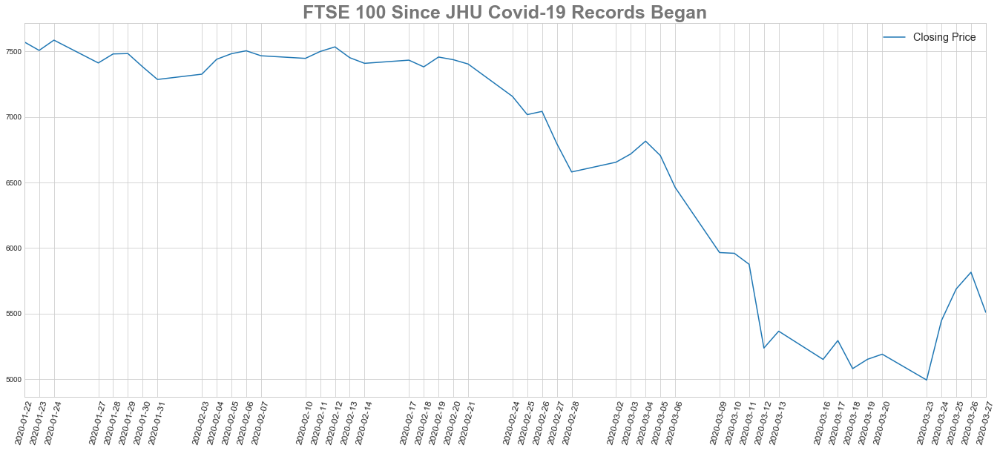

In [50]:
plt.style.use('seaborn-whitegrid')
fig= plt.figure(figsize=(18,7))

axes= fig.add_axes([0,0,1,1])

axes.plot(ftse, label='Closing Price')
plt.title('FTSE 100 Since JHU Covid-19 Records Began', color='#777777', size=25, weight=800)
plt.margins(x=0)
plt.xticks(rotation=75, size=12, ticks=ftse.index)
plt.legend(loc='upper right', fontsize='x-large')


plt.show()

### Scraping Live Index Data From Yahoo Finance

In [158]:
req1 = Request('https://finance.yahoo.com/quote/%5EFTSE%3FP%3DFTSE/history/', headers={'User-Agent': 'Mozilla/5.0'})
ftse = urlopen(req1).read()

In [159]:
soup = BeautifulSoup(ftse, 'lxml')
type(soup)

bs4.BeautifulSoup

In [160]:
rows = soup.find_all('tr')
for row in rows:
    row_td = row.find_all('td')

In [161]:
str_cells = str(row_td)
cleantext = BeautifulSoup(str_cells, "lxml").get_text()
list_rows = []
for row in rows:
    cells = row.find_all('td')
    str_cells = str(cells)
    clean = re.compile('<.*?>')
    clean2 = (re.sub(clean, '',str_cells))
    list_rows.append(clean2)

In [162]:
col_labels = soup.find_all('th')
ftse1 = pd.DataFrame(list_rows)

#parse HTML file


ftse1.head(10)

#extracted table displayed below

,0
0,[]
1,"[Apr 01, 2020, 5,671.96, 5,671.96, 5,414.72, 5..."
2,"[Mar 31, 2020, 5,563.70, 5,702.70, 5,545.90, 5..."
3,"[Mar 30, 2020, 5,510.30, 5,567.20, 5,351.80, 5..."
4,"[Mar 27, 2020, 5,815.70, 5,815.70, 5,407.10, 5..."
5,"[Mar 26, 2020, 5,688.20, 5,815.70, 5,503.40, 5..."
6,"[Mar 25, 2020, 5,446.00, 5,741.40, 5,400.50, 5..."
7,"[Mar 24, 2020, 4,993.90, 5,446.00, 4,993.90, 5..."
8,"[Mar 23, 2020, 5,190.80, 5,194.80, 4,922.80, 4..."
9,"[Mar 20, 2020, 5,151.60, 5,419.30, 5,151.60, 5..."


In [163]:
ftse2 = ftse1[0].str.split(', ', expand=True)

#split into columns

In [164]:
ftse3 = ftse2[1:-1] 

In [165]:
ftse3 = ftse3.iloc[:,0:4]

In [166]:
ftse3 = ftse3.drop(columns=[1])

In [167]:
ftse3[0] = ftse3[0].str.replace('[', '') 
ftse3[2] = ftse3[2].str.replace(',', '')
ftse3[3] = ftse3[3].str.replace(',', '') 

#clean up strings

In [168]:
ftse3 = ftse3.rename({0: 'Date', 2: 'Opening', 3: 'Closing'}, axis=1)

In [169]:
ftse3['Opening'] = pd.to_numeric(ftse3["Opening"], downcast="float")
ftse3['Closing'] = pd.to_numeric(ftse3["Closing"], downcast="float")

In [172]:
ftse3 = ftse3.iloc[::-1] 

#invert to chronological order

In [176]:
recents = ftse3.tail(50)
recents
#visualise final table

,Date,Opening,Closing
50,Jan 23,7571.899902,7572.100098
49,Jan 24,7507.700195,7642.200195
48,Jan 27,7586.000000,7586.000000
47,Jan 28,7412.100098,7491.399902
46,Jan 29,7480.700195,7514.700195
45,Jan 30,7483.600098,7483.600098
44,Jan 31,7382.000000,7398.299805
43,Feb 03,7286.000000,7360.000000
42,Feb 04,7326.299805,7442.100098
41,Feb 05,7439.799805,7512.399902


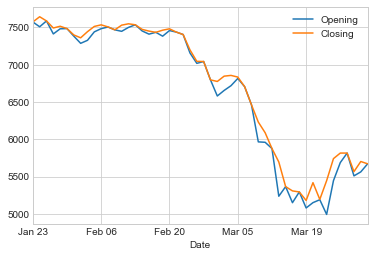

In [177]:
recents.plot(x='Date', y=["Opening", "Closing"])